## Brief network description

We are working with an openflights airport network from icon.colorado.edu. which is a weighted, directed, multigraph, network where the nodes represent airports worldwide and the direction of edge {i,j} indicates a regularly occurring commercial flight, by a particular airline from airport i to airport j. Multiple edges may exist between pairs of airports if multiple airlines offer that flight, or if one airline offers multiple such flights each day. The  number of nodes is: 3214 and the  number of edges is: 18859.
https://networks.skewed.de/net/openflights


In [1]:
import networkx as nx
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import collections
from collections import Counter
import powerlaw
import geopy.distance
import math
import statistics

# For the 
import folium
from shapely.geometry import Point, MultiPoint, LineString, MultiLineString, Polygon, MultiPolygon
from folium.plugins import HeatMap, MarkerCluster
from folium import plugins
import branca
import branca.colormap as cm
import seaborn as sns

from community import community_louvain
import matplotlib.cm as mcm

## Reading in our data

In [2]:
nodes = '../network/nodes.csv'
edges = "../network/edges.csv"

pd_nodes = pd.read_csv(nodes, sep=",")
pd_edges = pd.read_csv(edges, sep=",")
pd_edges.columns 

Index(['# source', ' target', ' distance', ' airline', ' airline_code',
       ' codeshare', ' equipment', ' stops'],
      dtype='object')

In [3]:
G =nx.from_pandas_edgelist(pd_edges,source='# source', target=' target', create_using = nx.MultiDiGraph)
print(nx.info(G))

MultiDiGraph with 3214 nodes and 66771 edges


## Global Values

In [4]:
G2 = nx.DiGraph(G)  #making the multiDigraph into only a directed graph
bet_centrality=nx.betweenness_centrality(G2.to_undirected())
bet_df  = pd.DataFrame(bet_centrality.values(), index=bet_centrality.keys())
#my name is sofie

## Functions

### Isolated Nodes

In [ ]:
def num_of_iso(G):
    num_of_iso = 0
    for i in nx.isolates(G):
        print(i)
        Num_of_iso += 1
    return num_of_iso

### Selfloops

In [ ]:
def selfloops(G):
    nx.number_of_selfloops(G)
    list_of_loops = []
    for i in nx.selfloop_edges(G):
        list_of_loops.append(i)
    if len(list_of_loops) > 0:
        print("Self loops can be found at node:", list_of_loops)
    else:
        print('No self loops')

### Degree Distributions

In [ ]:
def plot_degree_dist(G):
    degrees = [(G.degree(n)) for n in G.nodes()]#np.log?
    plt.hist(degrees, 50)
    plt.title('Degree Distribution')
    plt.xlabel('Degrees')
    plt.ylabel('Number of nodes having the degree')
    plt.show()

# The cumulative distribution plot (The y-axis in a CCDF is the probability of finding a node of degree k or high)
def plot_cum_dist(G):
    degrees = [G.degree(n) for n in G.nodes()]
    num_of_nodes = len(degrees)
    count_degrees = Counter([G.degree(n) for n in G.nodes()])
    count_degrees = collections.OrderedDict(sorted(count_degrees.items()))
    cum_dict = {}
    node_count = 0
    for degree, times in count_degrees.items():
        node_count += times
        cum_dict[degree]= 1 - (node_count/num_of_nodes)
    data = pd.DataFrame(list(cum_dict.items()),columns = ['x','P(k>=x)'])
    data.plot(x = 'x',y = 'P(k>=x)', loglog = True)
    plt.title('Cumulative distribution plot')
    plt.xlabel('SOMETHIN ELSE EDIT THIS')
    plt.ylabel('The probability of finding a node of degree k or higher')
    plt.show()

### Density

In [ ]:
def density_func(G):
    #Density of the graph (Using networkx)
    dens = nx.density(G)
    print('Networkx density:', str(round(dens*100, 3))+'%')

    #Density using the formular (simple directed graph)
    # total egdes / total nodes*(total nodes - 1)
    dens_form = (G.number_of_edges())/(G.number_of_nodes()*(G.number_of_nodes()-1))
    print('Formular density:', str(round(dens_form*100, 3))+'%')

### Global, local, average Clustering Coeffecients

In [ ]:
def cluster_coe(G):
    #Here we are assuming that connection is all that matters, therefore digraph is used not multidigraph 
    G_di = nx.DiGraph(G)
    global_clustering = nx.transitivity(G_di)

    # Local clustering
    local_clustering = nx.clustering(G_di)

    #Average clustering coefficient
    avg_clustering = nx.average_clustering(G_di)

    print("Global clustering:", global_clustering)
    print("Average clustering:",avg_clustering)
    print("Local clustering:",local_clustering)

### Diameter and Average path length

In [ ]:
def diameter_plus_avg_path_len(G):
    setup=False
    if setup==True:
        diameters=[]
        for i in (G.subgraph(c) for c in nx.strongly_connected_components(G)):
            diameters.append(nx.diameter(i))
        np.savetxt("../network/diameters.txt", diameters, delimiter="\n", fmt="%s")
    else:
        diameters=np.genfromtxt("../network/diameters.txt",dtype=int,delimiter="\n")
    
    #Path length distribution 
    shortest = dict(nx.all_pairs_shortest_path_length(G))
    #print(shortest)
    all_paths_len = []
    for i in shortest.values():
        for x in i.values():
            all_paths_len.append(x)
    print("Diameter: ",max(all_paths_len))
    print("Av path length:",statistics.mean(all_paths_len))

###  Log frequencies of path length

In [ ]:
def log_path_length(G):
    shortest = dict(nx.all_pairs_shortest_path_length(G))
    all_paths_len = []
    for i in shortest.values():
        for x in i.values():
            all_paths_len.append(x)
    count = Counter(all_paths_len)
    plt.bar(count.keys(),[math.log(i+0.1) for i in count.values()])
    plt.title("Log Frequencies of Path Lenghts")
    plt.xlabel("Path Length")
    plt.ylabel("Log Frequency")
    plt.show()
    print(count)

### Degree Centrality

In [ ]:
def deg_centrality_plot(G): 
    in_deg_centrality = nx.in_degree_centrality(G2)
    out_deg_centrality = nx.out_degree_centrality(G2)

    plt.figure()
    plt.title('Degree centrality plot')
    plt.xlabel('In degree centrality')
    plt.ylabel('Out degree centrality')
    plt.scatter(list(in_deg_centrality), list(out_deg_centrality))
    plt.show()

In [ ]:
def bet_centrality_plot():
    plt.hist(bet_centrality.values(),15)
    plt.title('Betweeness centrality plot')
    plt.xlabel('Betweeeness Centrality')
    plt.ylabel('Frequency of betweeness centrality values')

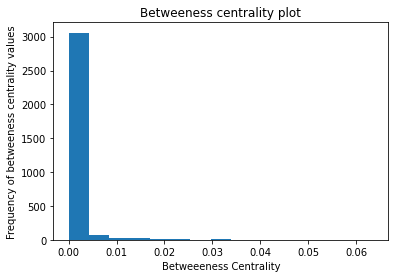

In [ ]:
bet_centrality_plot()
#bet_centrality.values()
#[log(x for x in bet_centrality.values()]

### Community discovery

In [ ]:
def community_plot(G):
    #make the graph undirected
    undirected_G = G.to_undirected()

    #Find the best partitioning
    partition = community_louvain.best_partition(undirected_G)

    #Draw the graph
    pos = nx.spring_layout(undirected_G)
    # color the nodes according to their partition
    cmap = mcm.get_cmap('viridis', max(partition.values()) + 1)
    nx.draw_networkx_nodes(G, pos, partition.keys(), node_size=40,
                        cmap=cmap, node_color=list(partition.values()))
    nx.draw_networkx_edges(undirected_G, pos, alpha=0.5)
    plt.title('Community plot')
    plt.show()

### Powerlaw

In [ ]:
def powerlaw_plot(G):
    degree_sequence = sorted([d for n, d in G.degree()], reverse=True)
    fit = powerlaw.Fit(degree_sequence)
    fig2 = fit.plot_pdf(color='b', linewidth=2)
    fit.power_law.plot_pdf(color='g', linestyle='--', ax=fig2)
    R, p = fit.distribution_compare('power_law', 'lognormal')
    plt.title('Powerlaw plot')
    plt.xlabel('Sorted degree sequence')
    plt.ylabel('The probability of the next node having more or equal connections to x')
    print (R, p)

## Basic Network statistics - Exploratory data analysis

### Connected Components

In [ ]:
print('Strongly connected components:', nx.number_strongly_connected_components(G))
print('Weakly connected components:', nx.number_weakly_connected_components(G))


Strongly connected components: 48
Weakly connected components: 7


### Isolated nodes

In [ ]:
## Find isolated nodes:
print("There are", num_of_iso(G), "isolated nodes")

There are 0 isolated nodes


### Self loops

In [ ]:
#Find self loops
selfloops(G)

Self loops can be found at node: [(1931, 1931)]


In [ ]:
#The self loop
pd_edges[pd_edges["# source"]==1931]

,# source,target,distance,airline,airline_code,codeshare,equipment,stops
57358,1931,1930,352.862275,IL,10121,0,AT7,0
57359,1931,1589,673.949617,IL,10121,0,737,0
57360,1931,1590,214.215655,IL,10121,0,AT7 737,0
57361,1931,1931,0.000000,IL,10121,0,AT7,0
57362,1931,1942,544.646348,IL,10121,0,AT7,0
57363,1931,1925,495.988136,IL,10121,0,737 AT7,0
57364,1931,1941,534.399882,IL,10121,0,737,0


### Degree Distribution &amp; Cumulative Distribution Plots

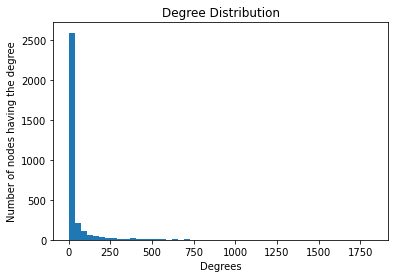

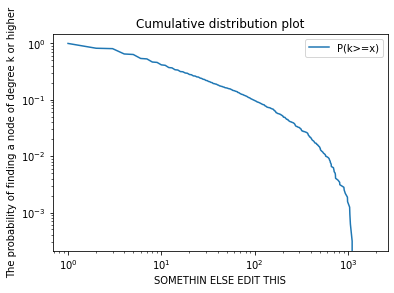

In [ ]:
plot_degree_dist(G)
plot_cum_dist(G)

### Density

In [ ]:
density_func(G)

Networkx density: 0.647%
Formular density: 0.647%


### Global, local, average Clustering Coeffecients

In [ ]:
cluster_coe(G)

Global clustering: 0.25005448521436646
Average clustering: 0.4782853255477227
Local clustering: {0: 1.0, 2: 0.390625, 3: 0.3888888888888889, 1: 0.5714285714285714, 4: 0.12298387096774194, 5: 0.8333333333333334, 2250: 0.7, 2256: 1.0, 2251: 1.0, 2254: 0.8333333333333334, 2253: 1.0, 2243: 0.6666666666666666, 2246: 1.0, 2245: 0.6666666666666666, 2255: 0.42857142857142855, 1610: 0.1276029434789416, 2244: 0.3333333333333333, 2247: 0.6666666666666666, 2241: 0.5, 2135: 0.15270935960591134, 2242: 0, 1612: 0.16646848989298454, 1951: 0.2537746806039489, 2048: 0.08319738988580751, 1485: 0.20884986225895316, 2248: 1.0, 2249: 0, 1115: 0.1575091575091575, 903: 0.20793950850661624, 1058: 0.23894731832675012, 1607: 0.17473118279569894, 1639: 0.1134456794550018, 2257: 0, 6: 0.3, 7: 0.17857142857142858, 2260: 1.0, 2261: 0.3333333333333333, 2264: 1.0, 8: 0.2857142857142857, 1988: 0.2, 2266: 0.6666666666666666, 2262: 1.0, 13: 0.4926644581164221, 14: 0, 295: 0.2964827610152425, 1989: 0.6666666666666666, 9: 

### Diameter and average path length

In [ ]:
diameter_plus_avg_path_len(G)

Diameter:  13
Av path length: 3.984675772976349


### Log frequencies of path length

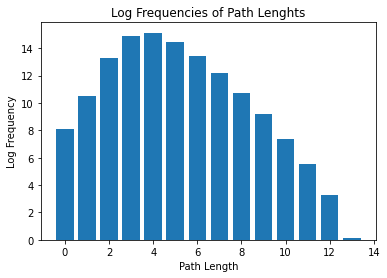

Counter({4: 3743759, 3: 2858173, 5: 1845025, 6: 680539, 2: 609545, 7: 197321, 8: 47043, 1: 36906, 9: 9886, 0: 3214, 10: 1576, 11: 248, 12: 27, 13: 1})


In [ ]:
log_path_length(G)

### Centrality

In [ ]:
# Closeness
nx.closeness_centrality(G);

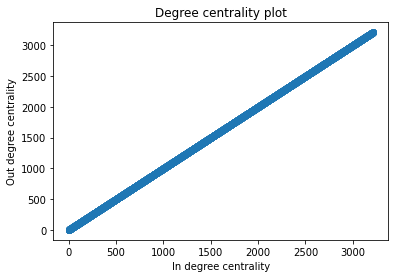

In [ ]:
deg_centrality_plot(G)# runs forever same can be represented in a different way maybe?

In [ ]:
#global reaching centality
nx.global_reaching_centrality(G2)

0.015025811825577145

### Community discovery

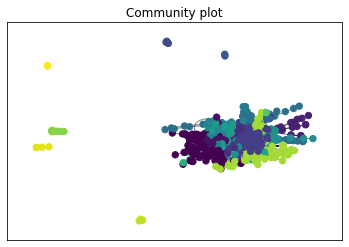

In [ ]:
community_plot(G)

### Power law

Calculating best minimal value for power law fit
-5.562512674077134 0.029117724710571603


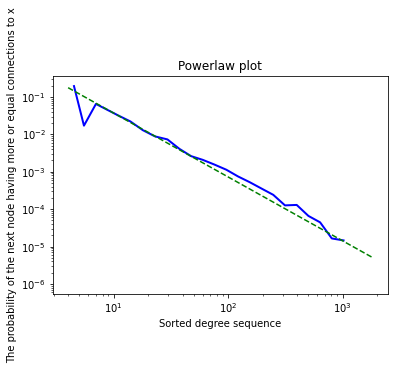

In [ ]:
powerlaw_plot(G)

### Visualization of the Network

In [ ]:
#66771
degree = [tup[1] for tup in sorted(G.degree)]

###pd_nodes["betweeness"]=[bet_centrality[x] for x in bet_centrality.keys()] wrong dont use, remove later (29.11.21)
pd_nodes['degree'] =  degree #new
pd_nodes[' longitude'] = pd_nodes[' longitude'].astype(float)
pd_nodes[' latitude'] = pd_nodes[' latitude'].astype(float)
pd_nodes2 = pd_nodes ###testing dataframe, merge into pd_nodes eventually
pd_nodes2 = pd.concat([pd_nodes2, bet_df], axis =1)
pd_nodes2
'''Dictionary with all the indexes of airports and their geographical placement'''
# i[1][0] = Index (Used to make the edges)
# i[1][7] = latitude
# i[1][8] = longitude
# i[1][9] = log degree

IDs = dict()
for i in pd_nodes.iterrows():
    ID = i[1][0]
    latitude = i[1][7]
    longitude = i[1][8]
    IDs[ID] = [latitude, longitude]

nodeDict = dict(G.nodes(data=True))
display(pd_nodes)

,# index,id,name,city,country,IATA/FAA,ICAO,latitude,longitude,altitude,timezone,DST,_pos,betweeness,degree
0,0,1,Goroka Airport,Goroka,Papua New Guinea,GKA,AYGA,-6.081690,145.391998,5282,10.0,U,"array([6.29268027, 1.37900375])",0.000000e+00,10
1,1,2,Madang Airport,Madang,Papua New Guinea,MAG,AYMD,-5.207080,145.789001,20,10.0,U,"array([6.30735453, 1.39906658])",2.034853e-06,16
2,2,3,Mount Hagen Kagamuga Airport,Mount Hagen,Papua New Guinea,HGU,AYMH,-5.826790,144.296005,5388,10.0,U,"array([6.3014785 , 1.38535133])",1.970254e-06,22
3,3,4,Nadzab Airport,Nadzab,Papua New Guinea,LAE,AYNZ,-6.569803,146.725977,239,10.0,U,"array([6.27849235, 1.39511825])",7.105836e-07,22
4,4,5,Port Moresby Jacksons International Airport,Port Moresby,Papua New Guinea,POM,AYPY,-9.443380,147.220001,146,10.0,U,"array([6.23308524, 1.34013967])",1.450479e-02,95
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3209,3209,11290,Kongolo Airport,Kongolo,Congo (Kinshasa),KOO,FZRQ,-5.394440,26.990000,1850,1.0,U,"array([5.5164688 , 1.37876336])",0.000000e+00,2
3210,3210,11436,Tarko-Sale Airport,Tarko-Sale,Russia,TQL,USDS,64.930801,77.818100,82,5.0,U,"array([5.87627232, 1.43157964])",6.174325e-04,2
3211,3211,11473,Jinchuan Airport,Jinchuan,China,JIC,ZLJC,38.542222,102.348333,4740,8.0,U,"array([6.169881 , 1.28830756])",0.000000e+00,12
3212,3212,11498,Alashankou Bole (Bortala) airport,Bole,China,BPL,ZWAX,44.895000,82.300000,1253,8.0,N,"array([6.07268073, 1.40575676])",0.000000e+00,2


In [ ]:
from math import log
degrees = np.array(sorted([(G.degree(n)) for n in G.nodes()]))
log_degrees = [log(degree,10) for degree in degrees]
max_degree = max(log_degrees)
half_max = max_degree/2
min_degree = min(log_degrees)
avg_degree = np.average(log_degrees)

/shared-libs/python3.7/py-core/lib/python3.7/site-packages/ipykernel_launcher.py:1: RuntimeWarning: divide by zero encountered in log
  """Entry point for launching an IPython kernel.


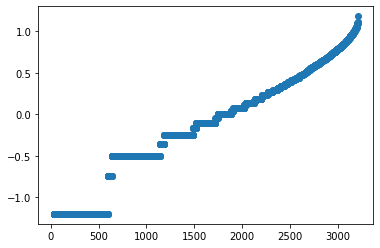

In [ ]:
plt.scatter([x for x in range(len(log_degrees))],np.log(log_degrees))

In [ ]:
points = np.vstack((pd_nodes[' latitude'], pd_nodes[' longitude'], pd_nodes['degree'], pd_nodes['# index'], pd_nodes[' name'] )).T
edges = np.vstack((pd_edges['# source'], pd_edges[' target'])).T
edges = np.delete(edges, -1, 0)

#centroid = list(MultiPoint(points).centroid.coords)[0]

m = folium.Map(control_scale = True)

colormap = cm.LinearColormap(colors=['blue','purple','red'],
                             index=[min_degree, half_max, max_degree], vmin=0, vmax=max_degree)

colormap.add_to(m)

for point in range(len(points)):
    label = str('<b>'+'Index: '+'</b>'+str(points[point][3])+'\n'+'<b>'+'Airport: '+'</b>'+points[point][4])
    folium.CircleMarker([points[point][0], points[point][1]], 
                        fill = True, 
                        fill_opacity = 0.1, 
                        radius = 0.01, 
                        popup = label,
                        color = colormap(log(points[point][2],10))).add_to(m)
"""
for edge in range(10000):#smaller value for sake of deepnote
    edge+=20000 ##accessing different slices of data as not in random order
    attr = {"font-weight": "bold", "font-size": "24"}
    source = IDs[edges[edge][0]]
    target = IDs[edges[edge][1]]
    #plane_line = folium.PolyLine([source,target], weight=1,color="black").add_to(m)
    #plugins.PolyLineTextPath(plane_line, "\u2708", repeat=True, offset=8, attributes=attr ).add_to(m)
    folium.PolyLine([source,target],weight=1,color="blue", opacity = 0.025, smooth_factor = 1 ).add_to(m)
"""
m

NameError: name 'np' is not defined

In [ ]:
points = np.vstack((pd_nodes[' latitude'], pd_nodes[' longitude'], pd_nodes['# index'])).T
edges = np.vstack((pd_edges['# source'], pd_edges[' target'])).T
edges = np.delete(edges, -1, 0)

centroid = list(MultiPoint(points).centroid.coords)[0]
partition = community_louvain.best_partition(G.to_undirected())
c_found=len(set(partition.values()))

cmap = cm.LinearColormap(colors= sns.color_palette("Paired", c_found), index = [i for i in range(c_found)],
                             vmin=0,vmax=23)


m = folium.Map(control_scale=True)
for point in range(len(points)):
    folium.CircleMarker([points[point][0], points[point][1]], fill = True, fill_opacity = .5, radius = 1, color= cmap(partition[points[point][2]])).add_to(m)

m

In [ ]:
pd_nodes['betweeness']

0       0.000000e+00
1       2.034853e-06
2       1.970254e-06
3       7.105836e-07
4       1.450479e-02
            ...     
3209    0.000000e+00
3210    6.174325e-04
3211    0.000000e+00
3212    0.000000e+00
3213    0.000000e+00
Name: betweeness, Length: 3214, dtype: float64

In [ ]:
[(255-i*20, 0+i*20, 0) for i in range (10)]

[(255, 0, 0),
 (235, 20, 0),
 (215, 40, 0),
 (195, 60, 0),
 (175, 80, 0),
 (155, 100, 0),
 (135, 120, 0),
 (115, 140, 0),
 (95, 160, 0),
 (75, 180, 0)]

In [ ]:
pd_nodes2.columns

Index([   '# index',        ' id',      ' name',      ' city',   ' country',
        ' IATA/FAA',      ' ICAO',  ' latitude', ' longitude',  ' altitude',
        ' timezone',       ' DST',      ' _pos', 'betweeness',     'degree',
                  0],
      dtype='object')

In [ ]:
points = np.vstack((pd_nodes[' latitude'], pd_nodes[' longitude'], pd_nodes2[0] )).T #pd_nodes2[0]refrences betweeness cent values
edges = np.vstack((pd_edges['# source'], pd_edges[' target'])).T
edges = np.delete(edges, -1, 0)

centroid = list(MultiPoint(points).centroid.coords)[0]

m = folium.Map(control_scale = True)

colormap = cm.LinearColormap(colors=[(0+i*25, 0, 255-i*25) for i in range (10)],index=[10**(-(10-x))for x in range (10)], vmin=min(pd_nodes2[0]), vmax=max(pd_nodes2[0]))

colormap.add_to(m)

for point in range(len(points)):
    folium.CircleMarker([points[point][0], points[point][1]], fill = True, fill_opacity = 0.1, radius =0.01 , color = colormap(points[point][2])).add_to(m)

m

## Other Stuff

In [ ]:
#plane types explored 
equipment=[]
for i in pd_edges[" equipment"]:
    possible=str(i).split()
    for j in possible:
        equipment.append(j)
unique_equipment_count=Counter(equipment)
unique_equipment=pd.DataFrame(set(equipment))
print("Amount of each plane type",unique_equipment_count)
print("Unique plane types",set(equipment))
#print(Counter(pd_edges[" equipment"])) nope


Amount of each plane type Counter({'320': 15400, '738': 10344, '319': 7847, '321': 3662, '73H': 3343, '737': 2753, '73W': 2492, 'CRJ': 2224, 'E90': 1968, 'AT7': 1595, '333': 1585, '73G': 1584, '332': 1439, 'DH4': 1387, '733': 1283, '763': 1183, 'CR7': 1161, '757': 1069, 'CR9': 1011, 'ER4': 989, 'ERJ': 947, '777': 945, '77W': 908, '330': 903, '739': 868, 'E70': 864, 'DH8': 785, 'M88': 725, '735': 705, 'E75': 701, 'M80': 656, '772': 633, 'ATR': 626, '73C': 623, '717': 614, '752': 604, '744': 599, '100': 590, '343': 490, 'DH3': 484, 'SF3': 475, '767': 461, '734': 460, 'CR2': 458, 'E95': 457, 'M90': 416, 'ERD': 415, '32S': 383, '773': 370, '736': 364, 'M83': 361, 'DHT': 354, '32A': 315, '75W': 311, 'DH1': 305, 'BEH': 290, '788': 287, 'AT4': 269, 'CNA': 266, 'CNC': 258, 'AT5': 256, '318': 253, 'BE1': 237, '310': 225, '346': 222, '388': 214, 'EM2': 214, '76W': 196, 'EMJ': 195, 'DH2': 187, 'F70': 175, 'AR1': 162, 'M82': 160, 'CRK': 159, '764': 153, '77L': 151, '73J': 145, '753': 143, 'F50': 1

In [ ]:
unique_equipment.to_csv("../network/planes.csv", sep='\t',index=False)

In [ ]:
#m = Basemap(projection='robin',lon_0=0,resolution='l')
#m.drawcountries(linewidth = 0.5)
#m.fillcontinents(color='white',lake_color='white')
#m.drawcoastlines(linewidth=0.5)

In [ ]:
in_degrees=[]
out_degrees=[]
for node in G.nodes():
    in_degrees.append(G.in_degree(node))
    out_degrees.append(G.out_degree(node))

In [ ]:
max_occurances=Counter(maxinout)
min_occurances=Counter(mininout)

NameError: name 'maxinout' is not defined

In [ ]:
min_occurances[0]#could this cause issues?

NameError: name 'min_occurances' is not defined

In [ ]:
def find_cap(G,per_extra=0.25):
    assert per_extra<=1 and per_extra>=0, "per_extra is a probability please enter a value from 1 to 0"
    cap=["na" for i in G.nodes()]
    for node in G.nodes():
        cap[node]=math.floor(mininout[node]+mininout[node]*per_extra)
    return cap

(array([2.000e+00, 1.100e+01, 4.400e+01, 3.052e+03, 8.900e+01, 8.000e+00,
        4.000e+00, 1.000e+00, 1.000e+00, 2.000e+00]),
 array([-12. ,  -8.7,  -5.4,  -2.1,   1.2,   4.5,   7.8,  11.1,  14.4,
         17.7,  21. ]),
 <BarContainer object of 10 artists>)

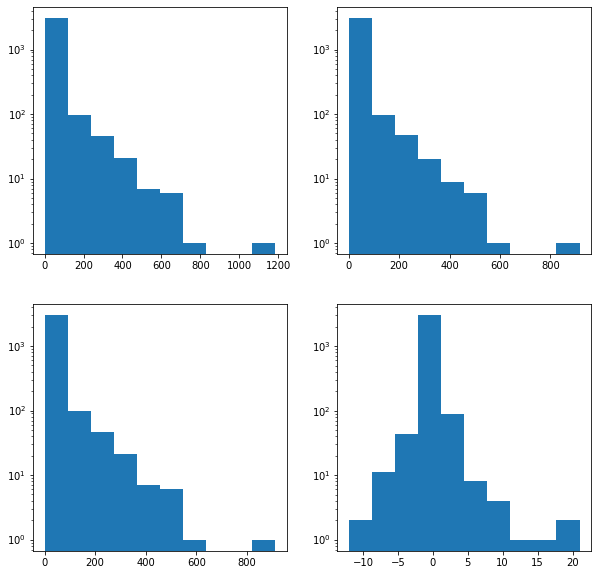

In [ ]:
inminout=np.array(in_degrees)-np.array(out_degrees)
maxinout=np.maximum(np.array(in_degrees),np.array(out_degrees))
mininout=np.minimum(np.array(in_degrees),np.array(out_degrees))

fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(10,10))

ax[0,0].hist(find_cap(G,per_extra=0.3),log=True)
ax[1,0].hist(mininout,log=True)
ax[0,1].hist(maxinout,log=True)
ax[1,1].hist(inminout,log=True) #most airposts have similar in and out degrees as is to be expecte

## Distance from airport to airport

In [ ]:
def distance(point1, point2):
    return geopy.distance.distance(point1, point2).km

In [ ]:
# Testing the distance formula.
point1 = [pd_nodes[' latitude'][0], pd_nodes[' longitude'][0]]
point2 = [pd_nodes[' latitude'][1], pd_nodes[' longitude'][1]]

distance(point1, point2)

106.24895852093681

# Model 

In [ ]:
distance = '../../distance_matrix.csv'
pd_distance = pd.read_csv(distance, sep = ',')

In [ ]:

def redirect(G, nodes, distance, airport, percent):
    #Finding the index to take out
    out_airport = airport #random.randint(0,3213)
    #Find all inbound fligths
    inbound = G.in_degree(out_airport)
    #find all airports in the radius
    in_radius = []
    for i in range(nodes.shape[0]):
        if distance[str(out_airport)][i] < 475 and distance[str(out_airport)][i] > 0: #Needs to be higher than 0, otherwise it chooses it self
            in_radius.append(i)
            
    #Find sum of flights
    flights_pos = 0
    for airport in in_radius:
        the_sum = G.in_degree(airport)
        the_sum += G.out_degree(airport)
        flights_pos += int(the_sum*(percent/100))
        
    flights_available = flights_pos-inbound
    
    success = -1
    if flights_available >= 0:
        success = 1
    else: 
        success = 0
    
    return success
    
    

In [ ]:
possible_10 = []

for i in range(pd_nodes.shape[0]):
    possible_10.append(redirect(G,pd_nodes,  pd_distance, i, 10))

Counter(possible_10)

Counter({0: 753, 1: 2461})

In [ ]:
# With 10% 
points = np.vstack((pd_nodes[' latitude'], pd_nodes[' longitude'], possible_10 )).T
edges = np.vstack((pd_edges['# source'], pd_edges[' target'])).T
edges = np.delete(edges, -1, 0)

centroid = list(MultiPoint(points).centroid.coords)[0]

m = folium.Map(control_scale = True)

colormap = cm.LinearColormap(colors=['red','green'],
                             index=[0, 1], vmin=0, vmax=1)

colormap.add_to(m)

for point in range(len(points)):
    folium.CircleMarker([points[point][0], points[point][1]], fill = True, fill_opacity = 0.1, radius =0.01 , color = colormap(points[point][2])).add_to(m)
m

In [ ]:
possible_20 = []

for i in range(pd_nodes.shape[0]):
    possible_20.append(redirect(G,pd_nodes,  pd_distance, i, 20))

Counter(possible_20)

Counter({0: 350, 1: 2864})

In [ ]:
# With 20% 
points = np.vstack((pd_nodes[' latitude'], pd_nodes[' longitude'], possible_20 )).T
edges = np.vstack((pd_edges['# source'], pd_edges[' target'])).T
edges = np.delete(edges, -1, 0)

m = folium.Map(control_scale = True)

colormap = cm.LinearColormap(colors=['red','green'],
                             index=[0, 1], vmin=0, vmax=1)

colormap.add_to(m)

for point in range(len(points)):
    folium.CircleMarker([points[point][0], points[point][1]], fill = True, fill_opacity = 0.1, radius =0.01 , color = colormap(points[point][2])).add_to(m)
m

<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=30c69275-ad4c-4319-be77-065d0edffda8' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>